# 1. Librerías

In [51]:
import pandas as pd
import xml.etree.ElementTree as et
import shutil
import os
import matplotlib.pyplot as plt
import matplotlib as mpl

import geopandas as gpd
#import folium
import numpy as np

# 2. Importamos información de PRTR

2.1 Fuentes de información: descomprimimos los ficheros

Fuente: *https://prtr-es.es/informes/*

Los complejos mejor descargarlos del inventario de Instalaciones ya que sino no tienen las coordenadas (*https://prtr-es.es/Informes/InventarioInstalacionesIPPC.aspx*).

In [5]:
fileComplejo = "PRTR_Espana_MITECO_Complejos"
fileEmisiones = "PRTR_Espana_MITECO_Emisiones"#2021
fileResiduos = "PRTR_Espana_MITECO_Residuos"#2021

2.2 Función para la importación de XML

In [4]:
def importXML(file):
    xtree = et.parse(f"./input/{file}.xml")
    xroot = xtree.getroot()

    lsDatos = []
    for x in xroot:
        data_dict = {}
        for i in x:
            if i.tag == "coordenadas":
                data_dict['latitud'] = i.find('latitud').text
                data_dict['longitud'] = i.find('longitud').text
            else:
                data_dict[i.tag] = i.text
        lsDatos = lsDatos + [data_dict]
        #lsDatos.append(pd.Series(dict([[i.tag,i.text] for i in x])))
    return pd.DataFrame(lsDatos)

In [ ]:
def get_file(file):
    zip_file = f"./input/{file}.zip"
    url = f"https://prtr-es.es/informes/descargas/{file}.zip"
    
    response = requests.get(url)
    with open(zip_file, 'wb') as out_file:
        for chunk in response.iter_content(chunk_size=512):
            if chunk:  # filter out keep-alive new chunks
                out_file.write(chunk)



In [95]:
#Importamos los complejos
shutil.unpack_archive(f"./input/{fileComplejo}.zip", "./input")
dfComplejos = importXML('PRTR_Espana_MITECO_Inventario de complejos industriales')
os.remove(f"./input/{fileComplejo}.xml")

In [121]:
#Importamos las emisiones históricas
y_ini = 2001
y_fin = 2022
for y in range(y_ini,y_fin+1):
    get_file(f"{fileEmisiones}{y}")

    shutil.unpack_archive(f"./input/{fileEmisiones}{y}.zip", "./input")
    dfEmisiones_y = importXML(f"{fileEmisiones}{y}")
    dfEmisiones_y['year'] = y
    os.remove(f"./input/{fileEmisiones}{y}.xml")
    os.remove(f"./input/{fileEmisiones}{y}.zip")

    #dfResiduos = importXML(fileResiduos.replace("residuos","Residuos"))
    
    if y_ini == y:
        dfEmisiones = dfEmisiones_y
    else:
        dfEmisiones = pd.concat([dfEmisiones,dfEmisiones_y],ignore_index=True)
    
    print(f"Emisiones {y} importadas")

Emisiones 2001 importadas
Emisiones 2002 importadas
Emisiones 2003 importadas
Emisiones 2004 importadas
Emisiones 2005 importadas
Emisiones 2006 importadas
Emisiones 2007 importadas
Emisiones 2008 importadas
Emisiones 2009 importadas
Emisiones 2010 importadas
Emisiones 2011 importadas
Emisiones 2012 importadas
Emisiones 2013 importadas
Emisiones 2014 importadas
Emisiones 2015 importadas
Emisiones 2016 importadas
Emisiones 2017 importadas
Emisiones 2018 importadas
Emisiones 2019 importadas
Emisiones 2020 importadas
Emisiones 2021 importadas
Emisiones 2022 importadas


In [122]:
dfEmisiones.groupby('year').size()

year
2001     2513
2002     2064
2003     2307
2004     3488
2005     3246
2006     3547
2007     4685
2008     4738
2009     4522
2010     4332
2011     4382
2012     4240
2013     4355
2014     4649
2015     4806
2016     4821
2017    41826
2018    41644
2019    41637
2020    45515
2021    46105
2022    48084
dtype: int64

In [123]:
print(dfComplejos.shape)
dfComplejos.head(2)

(9066, 17)


,CodigoPRTR,NombreDelComplejo,EmpresaMatriz,ActividadEconomica,CNAE-2009,CodPRTR_DEI,CodPRTR,CodIPPC,Direccion,CodPostal,Poblacion,Municipio,Provincia,CCAA,DemarcacionHidrografica,latitud,longitud
0,2,"QUALITY CHEMICALS, S.L.L.","QUALITYCHEMICALS, S.L.L. (ABANS EUROLABO, S.A.)",FABRICACIÓ DE PRODUCTES QUÍMICS DIVERSOS,20.14,4.a.ii,4.(a).(ii),4.1.b),"FORNAL (POL IND CAN COMELLES SUD) ,",08242,ESPARREGUERA,Esparreguera,Barcelona,Cataluña,Cuencas internas de Cataluña,"41,442322","2,242180"
1,7954,KNAUF GMBH SUCURSAL EN ESPAÑA - PLANTA DE ESCÚZAR,KNAUF GMBH SUCURSAL EN ESPAÑA,23.62 - FABRICACIÓN DE ELEMENTOS DE YESO PARA ...,23.62,1.c.ii (b),1.(c),1.1.b),DE INCA,18130,None,Escúzar,Granada,Andalucía,Cuenca Mediterránea Andaluza,"37,067000","-3,767000"


# 3. Emisiones

In [126]:
dictEmisiones = {
    'Metano (CH4)':'CH4',
    'Amoniaco (NH3)':'NH3',
    'Óxidos de nitrógeno (NOx/NO2)':'NO2',
    'Óxido nitroso (N2O)':'N2O',
    'Partículas (PM10)':'PM10',
    'Monóxido de carbono (CO)':'CO',
    'Partículas totales en suspensión (PST)':'PST',
    'Dióxido de carbono (CO2)':'CO2',
    'Óxidos de azufre (SOx/SO2)':'SO2',
    'Compuestos orgánicos volátiles distintos del metano (COVNM)':'COVNM',
    'Carbono orgánico total (COT) (aire)':'COT'
}


Nos quedamos solo con los contaminantes de aire.

Creamos nuevos campos:
* Cantidad total, con el importe en formato float.
* Agrupación de conteminantes, seleccionando aquellos contaminantes más comunes

In [127]:
dfEmisiones = dfEmisiones[dfEmisiones.MedioReceptor=="Aire"]\
    .assign(CantidadTotal = lambda x: x.CantidadTotalkgporaño.astype(float),
            aggContaminante = lambda c: c.Contaminante.map(dictEmisiones))
dfEmisiones.fillna({"aggContaminante":"OTH"}, inplace=True)
dfEmisiones.head(2)

,CodigoPRTR,NombreDelComplejo,AnyoReferencia,Contaminante,CantidadTotalkgporaño,MedioReceptor,Metodo,Metodo_MCE,year,CantidadTotal,aggContaminante
0,67,GRANJA EL BENZAL,2001,Metano (CH4),182000.00000000000000,Aire,C,NaN,2001,182000.0,CH4
1,1379,ES222170000001-CERDOS-SENA,2001,Metano (CH4),315000.00000000000000,Aire,C,NaN,2001,315000.0,CH4


Analizamos como se distribuyen las cantidades por tipo Contaminante.

In [128]:
dfEmisiones.groupby('aggContaminante')['CantidadTotal'].describe()

,count,mean,std,min,25%,50%,75%,max
aggContaminante,,,,,,,,
CH4,28743.0,1.487404e+05,1.112856e+06,2.820000e-05,7200.00000,23502.740,4.316596e+04,1.453433e+08
CO,14056.0,3.534434e+05,3.780291e+06,3.460000e-06,139.10400,1410.000,1.740700e+04,1.220000e+08
CO2,15359.0,1.714272e+08,6.177121e+08,3.270600e-04,521484.04850,4296915.266,7.620279e+07,1.070000e+10
COT,2070.0,2.563764e+04,1.896972e+05,1.000000e-02,224.05000,1474.245,6.499610e+03,5.807358e+06
COVNM,9611.0,1.227232e+05,4.167676e+05,2.000000e-06,64.94000,820.000,2.490836e+04,7.120000e+06
N2O,22021.0,4.499643e+03,7.742978e+04,2.000000e-06,34.75000,91.660,2.510000e+02,8.810000e+06
NH3,43875.0,2.211879e+04,1.124103e+05,3.600000e-06,10500.00000,16300.000,2.450000e+04,2.270000e+07
NO2,23455.0,2.838181e+05,1.429239e+06,5.900000e-06,64.00000,2458.530,8.384088e+04,5.430000e+07
OTH,54606.0,1.748028e+03,1.696674e+04,1.000000e-14,0.00973,1.280,5.060750e+01,1.020000e+06


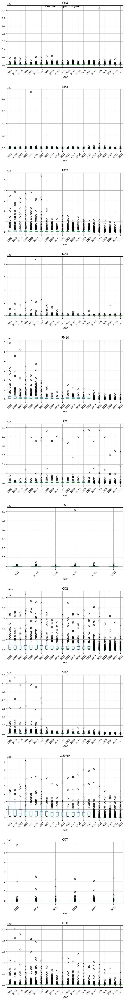

In [144]:
# Create a figure and axes
emi = list(dictEmisiones.values()) + ['OTH']

fig, ax = plt.subplots(nrows=len(emi), ncols=1, figsize=(8, 5*len(emi)))

for i, e in enumerate(emi):
    dfEmisiones.loc[(dfEmisiones.aggContaminante==e)].boxplot('CantidadTotal', by='year' , ax=ax[i])
    ax[i].set_title(e)
    ax[i].tick_params(axis='x', rotation=45)

plt.tight_layout(pad=3.0)
plt.title=''

# Show the plBoxPlotot
plt.show()

Agrupamos porcódigo PRTR para saber cada complejo cuanto contamina.

In [161]:
aggEmisiones = dfEmisiones.\
    groupby(["CodigoPRTR","aggContaminante","year"])["CantidadTotal"].\
    sum().\
    groupby(["CodigoPRTR","aggContaminante"]).\
    agg(['max','mean','sum']).\
    reset_index().pivot(index="CodigoPRTR",columns="aggContaminante",values=["max","mean","sum"]).\
    fillna(0)

aggEmisiones.columns = [f"{j}_{i}" for i,j in aggEmisiones.columns]
aggEmisiones.head()


,CH4_max,CO_max,CO2_max,COT_max,COVNM_max,N2O_max,NH3_max,NO2_max,OTH_max,PM10_max,...,CO2_sum,COT_sum,COVNM_sum,N2O_sum,NH3_sum,NO2_sum,OTH_sum,PM10_sum,PST_sum,SO2_sum
CodigoPRTR,,,,,,,,,,,,,,,,,,,,,
100,6211.78,0.0,0.0,0.0,0.0,650.5,43600.0,0.0,0.0,0.0,...,0.0,0.0,0.0,650.50,309608.633,0.0,0.0,0.0,0.0,0.0
1000,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,90.0,0.0,...,0.0,0.0,0.0,0.00,0.000,0.0,446.1,0.0,0.0,0.0
10001,7875.00,0.0,0.0,0.0,0.0,35.0,8750.0,35.0,0.0,0.0,...,0.0,0.0,0.0,70.00,26250.000,35.0,0.0,0.0,0.0,0.0
10002,10800.00,0.0,0.0,0.0,0.0,48.0,12000.0,0.0,0.0,0.0,...,0.0,0.0,0.0,288.00,72000.000,0.0,0.0,0.0,0.0,0.0
10003,19566.00,0.0,0.0,0.0,0.0,87.0,10870.0,0.0,0.0,0.0,...,0.0,0.0,0.0,434.84,54350.000,0.0,0.0,0.0,0.0,0.0


In [162]:
aggEmisiones = dfComplejos.merge(aggEmisiones,how="left",left_on="CodigoPRTR",right_on="CodigoPRTR").\
    fillna(0)

aggEmisiones.latitud = aggEmisiones.latitud.str.replace(",",".").astype(float)
aggEmisiones.longitud = aggEmisiones.longitud.str.replace(",",".").astype(float)
aggEmisiones.head(2)

,CodigoPRTR,NombreDelComplejo,EmpresaMatriz,ActividadEconomica,CNAE-2009,CodPRTR_DEI,CodPRTR,CodIPPC,Direccion,CodPostal,...,CO2_sum,COT_sum,COVNM_sum,N2O_sum,NH3_sum,NO2_sum,OTH_sum,PM10_sum,PST_sum,SO2_sum
0,2,"QUALITY CHEMICALS, S.L.L.","QUALITYCHEMICALS, S.L.L. (ABANS EUROLABO, S.A.)",FABRICACIÓ DE PRODUCTES QUÍMICS DIVERSOS,20.14,4.a.ii,4.(a).(ii),4.1.b),"FORNAL (POL IND CAN COMELLES SUD) ,",08242,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0
1,7954,KNAUF GMBH SUCURSAL EN ESPAÑA - PLANTA DE ESCÚZAR,KNAUF GMBH SUCURSAL EN ESPAÑA,23.62 - FABRICACIÓN DE ELEMENTOS DE YESO PARA ...,23.62,1.c.ii (b),1.(c),1.1.b),DE INCA,18130,...,145400000.0,0.0,5184.0,260.0,3422.0,259300.0,2.28953,24720.0,24720.0,10760.0


In [163]:
aggEmisiones.to_csv("./output/aggEmisiones.csv",index=False)

### Ploteamos en un mapa la contaminación generada a nivel estatal con un radio de 10,20 y 30 km al rededor del complejo

In [ ]:
import geopandas as gpd
import folium
from ipywidgets import interact, Dropdown

In [2]:
aggEmisiones = pd.read_csv("./output/aggEmisiones.csv")

In [18]:
# Step 1: Create a GeoDataFrame
gdf = gpd.GeoDataFrame(aggEmisiones, geometry=gpd.points_from_xy(aggEmisiones.longitud, aggEmisiones.latitud))

# Step 2: Create buffer areas
buffer_10km = gdf.buffer(10000)
buffer_20km = gdf.buffer(20000)
buffer_30km = gdf.buffer(30000)

In [60]:
#[l for l in dir(mcolors) if "col" in l.lower()]
[c for c in mpl.colormaps if "Re" in c]

['Reds', 'Reds_r']

In [87]:
q = gdf[gdf.CO2_sum>0].CO2_sum.quantile([0.1,0.9])
gdf.loc[gdf.CO2_sum>0,'CO2_sum_cap_floor'] = gdf[gdf.CO2_sum>0]["CO2_sum"].clip(lower=q.iloc[0],upper=q.iloc[1]) 

In [116]:
#Prueba
gdf.set_crs(epsg=4326, inplace=True)

#Creamos las selectores
calculation_dropdown = Dropdown(options=['sum', 'max', 'mean'], description='Calculation Method:')
contaminant_dropdown = Dropdown(options=['CO2', 'COT'], description='Contaminant:')
radio_dropdown = Dropdown(options=[10,20,30], description='Radio:')



# Creamos el mapa
m = gdf[gdf.CO2_sum>0].sort_values("CO2_sum",ascending=True).explore(f"CO2_sum", 
                cmap="Reds",
                tiles="OpenStreetMap", 
                vmin = gdf[gdf.CO2_sum>0].CO2_sum.quantile(0.05), 
                vmax = gdf[gdf.CO2_sum>0].CO2_sum.quantile(0.95),
                marker_type="circle", 
                marker_kwds={"radius":20000, "fill":True, "fillOpacity":0.01}, 
                style_kwds={"stroke":False})

# function defining what should happen if the user selects a specific date and continent
#def on_trait_change(calculation_method, contaminant, radio):
    #df=world[world['continent'] == continent] # sub set data
    
#    display(m)

# generating the interactive plot with two widgets
#interact(on_trait_change,  calculation_method=calculation_dropdown, contaminant=contaminant_dropdown, radio=radio_dropdown)

In [117]:
display(m)

# 4. Creamos factores de contaminación de aire cercanos a municipio

In [146]:
# base= (dfComplejos["CNAE-2009"]
base = dfComplejos["CNAE-2009"].apply(lambda x: x[:-1])
pd.DataFrame(np.unique(base,return_counts=True)).T.sort_values(1, ascending=False)

,0,1
2,01.4,4347
53,23.3,458
101,38.2,453
67,25.6,357
41,20.1,331
...,...,...
107,43.1,1
106,42.1,1
105,41.2,1
104,41.1,1


In [200]:
dist_table = pd.read_pickle("../municipios/output/distance_table.pkl")
dist_table.head()

TypeError: no default __reduce__ due to non-trivial __cinit__

In [6]:
#dfComplejos
dfComplejos[dfComplejos.CodPostal=='08872']
#sum(dfComplejos.Municipio=='Garraf')

,CodigoPRTR,NombreDelComplejo,EmpresaMatriz,ActividadEconomica,CNAE-2009,CodPRTRDEI,CodIPPC,Direccion,CodPostal,Poblacion,Municipio,Provincia,CCAA,DemarcacionHidrografica
2736,3037,CEMENTOS PORTLAND VALDERRIVAS (VALLCARCA),"CEMENTOS PORTLAND VALDERRIVAS, S.A.",FABRICACIÓ DE CIMENT,23.51,3.c.i.(b).1,3.1.a) ii),COMARCAL 31 (VALLCARCA),08872,None,Sitges,Barcelona,Cataluña,Cuencas internas de Cataluña


In [198]:
cementeras = dist_table.NAMEUNIT.isin(dfComplejos[dfComplejos['CNAE-2009']=='23.51'].Municipio)
ganaderas = dist_table.NAMEUNIT.isin(dfComplejos[[i[:-1]=='01.4' for i in dfComplejos['CNAE-2009']]].Municipio)
ceramica = dist_table.NAMEUNIT.isin(dfComplejos[[i[:-1]=='23.3' for i in dfComplejos['CNAE-2009']]].Municipio)
sum(cementeras)
sum(ganaderas)
sum(ceramica)

NameError: name 'dist_table' is not defined

In [197]:
dfComplejos[dfComplejos['CNAE-2009']=='01.4']

,CodigoPRTR,NombreDelComplejo,EmpresaMatriz,ActividadEconomica,CNAE-2009,CodPRTRDEI,CodIPPC,Direccion,CodPostal,Poblacion,Municipio,Provincia,CCAA,DemarcacionHidrografica,codine,NOMBRE,NATCODE


In [152]:
dfComplejos[[i[:-1]=='01.4' for i in dfComplejos['CNAE-2009']]].shape

(4347, 14)

In [75]:
munis = dist_table[dist_table.NAMEUNIT.isin(["Barrika", "Barcelona", "Toledo"])]

In [166]:
#dist_table.boundary.explore(style_kwds={"linewidth":0.5})
#m = dist_table[cementeras].centroid.explore(style_kwds={"color":"red", "fill":False, "weight":5} )
m = dist_table[ganaderas].centroid.explore(style_kwds={"color":"purple", "fill":False, "weight":5, "opacity":0.4} )
dist_table[ceramica].centroid.explore(m=m, style_kwds={"color":"orange", "fill":False, "weight":5, "opacity":0.4} )
dist_table.centroid.explore(m=m, style_kwds={"color":"red", "fill":False, "weight":10, "opacity":0.1} )
#dist_table.boundary.explore(m=m, style_kwds={"color":"black", "weight":0.5, "opacity":0.2} )

munis.centroid.explore(m=m, marker_type="circle",marker_kwds={"color":"blue", "radius":30000, "fill":True}, style_kwds={"stroke":False, "fillOpacity":0.2})
munis.centroid.explore(m=m, marker_type="circle",marker_kwds={"color":"blue", "radius":20000, "fill":True}, style_kwds={"stroke":False, "fillOpacity":0.2})
munis.centroid.explore(m=m, marker_type="circle",marker_kwds={"color":"blue", "radius":10000, "fill":True}, style_kwds={"stroke":False, "fillOpacity":0.2})
munis.centroid.explore(m=m, marker_type="circle",marker_kwds={"color":"blue", "radius":5000, "fill":True}, style_kwds={"stroke":False, "fillOpacity":0.2})
m

<AxesSubplot:>

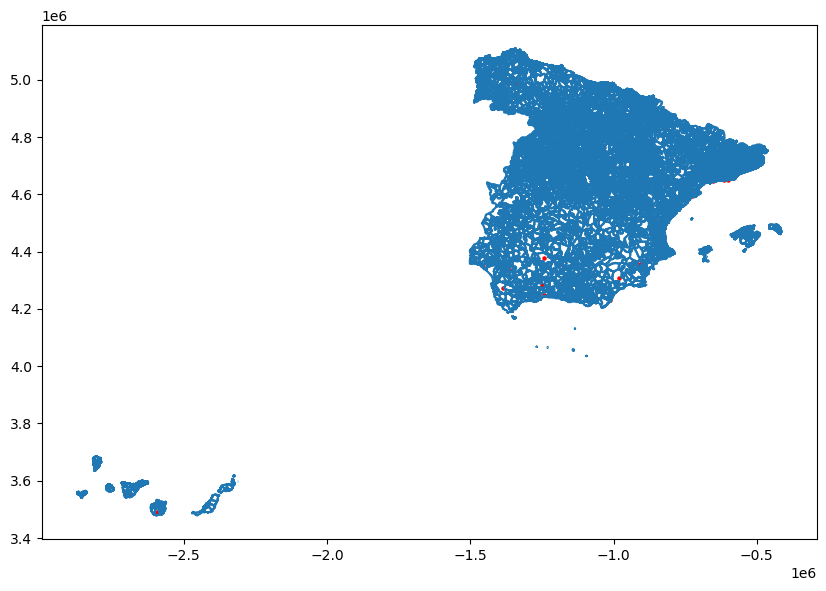

In [36]:
fig, ax = plt.subplots(figsize=(10, 10))
dist_table.boundary.plot(ax=ax)
dist_table[cementeras].centroid.plot(ax=ax, color='red', markersize=5, )

In [8]:
#dfEmisiones.groupby("MedioReceptor").count()
dfEmisiones.head()

,CodigoPRTR,NombreDelComplejo,AnyoReferencia,Contaminante,CantidadTotalkgporaño,MedioReceptor,Metodo,Metodo_MCE
0,4,"SARRIÓ PAPELERA DE ALMAZÁN, S.L.U.",2021,Metano (CH4),259.83000000000000,Aire,C,None
1,4,"SARRIÓ PAPELERA DE ALMAZÁN, S.L.U.",2021,Monóxido de carbono (CO),2412.70000000000000,Aire,C,None
2,4,"SARRIÓ PAPELERA DE ALMAZÁN, S.L.U.",2021,Dióxido de carbono (CO2),10268000.00000000000000,Aire,C,None
3,4,"SARRIÓ PAPELERA DE ALMAZÁN, S.L.U.",2021,Óxido nitroso (N2O),445.42000000000000,Aire,C,None
4,4,"SARRIÓ PAPELERA DE ALMAZÁN, S.L.U.",2021,Compuestos orgánicos volátiles distintos del m...,556.78000000000000,Aire,C,None


In [9]:
#dfEmisiones[dfEmisiones.CodigoPRTR=='3037']
#dfEmisiones.groupby("MedioReceptor").count()
#dfEmisiones[dfEmisiones.MedioReceptor != 'Aire']
#dfEmisiones[dfEmisiones.MedioReceptor == 'Litoral']
dfEmisiones[dfEmisiones.CodigoPRTR == "10872"].iloc[0]["Contaminante"]


'Compuestos orgánicos volátiles distintos del metano (COVNM)'

In [10]:
dfResiduos[dfResiduos.CodigoPRTR=='3037']

,CodigoPRTR,NombreDelComplejo,Provincia,AnyoReferencia,Residuo,CantidadTransferidatoneladasporaño,OperacionTratamiento,Metodo,Metodo_MC,EntidadResponsable,DireccionEntidad,DireccionLugarTransferencia
14209,3037,CEMENTOS PORTLAND VALDERRIVAS (VALLCARCA),Barcelona,2021,10 01 02 Cenizas volantes de carbón,430.98000000000000,R5 Reciclado o recuperación de otras materias ...,M,None,None,None,None
14210,3037,CEMENTOS PORTLAND VALDERRIVAS (VALLCARCA),Barcelona,2021,13 02 05 Aceites minerales no clorados de moto...,3.61000000000000,R13 Acumulación de residuos para someterlos a ...,M,None,Residuos peligrosos dentro de España,NaN,NaN
14211,3037,CEMENTOS PORTLAND VALDERRIVAS (VALLCARCA),Barcelona,2021,15 01 03 Envases de madera,1.20000000000000,R13 Acumulación de residuos para someterlos a ...,M,None,None,None,None
14212,3037,CEMENTOS PORTLAND VALDERRIVAS (VALLCARCA),Barcelona,2021,"15 02 03 Absorbentes, materiales de filtración...",15.34000000000000,D5 Vertido en lugares especialmente diseñados ...,M,None,None,None,None
14213,3037,CEMENTOS PORTLAND VALDERRIVAS (VALLCARCA),Barcelona,2021,"17 01 07 Mezclas de hormigón, ladrillos, tejas...",6.14000000000000,D5 Vertido en lugares especialmente diseñados ...,M,None,None,None,None
14214,3037,CEMENTOS PORTLAND VALDERRIVAS (VALLCARCA),Barcelona,2021,20 01 40 Metales,68.74000000000000,R13 Acumulación de residuos para someterlos a ...,M,None,None,None,None
14215,3037,CEMENTOS PORTLAND VALDERRIVAS (VALLCARCA),Barcelona,2021,20 03 01 Mezclas de residuos municipales,1.86000000000000,D15 Almacenamiento previo a cualquiera de las ...,M,None,None,None,None
14216,3037,CEMENTOS PORTLAND VALDERRIVAS (VALLCARCA),Barcelona,2021,20 03 01 Mezclas de residuos municipales,3.72000000000000,D5 Vertido en lugares especialmente diseñados ...,M,None,None,None,None


In [168]:
dfResiduos.groupby(["Residuo","OperacionTratamiento"]).count()
#len(dfResiduos)

48748

In [153]:
dfComplejos[["CNAE-2009","ActividadEconomica"]].sort_values(["CNAE-2009","ActividadEconomica"]).groupby("CNAE-2009").first().to_dict()

{'ActividadEconomica': {'01.19': '01.19 - OTROS CULTIVOS NO PERENNES',
  '01.21': '01.21 - CULTIVO DE LA VID',
  '01.23': '-',
  '01.24': '-',
  '01.41': 'AVICULTURA',
  '01.42': 'EXPLOTACIÓN DE GANADO PORCINO',
  '01.45': 'EXPLOTACIÓN DE GANADO PORCINO INTENSIVO',
  '01.46': '-',
  '01.47': '-',
  '01.49': 'AVICULTURA',
  '01.50': 'AGRICOLA GANADERA',
  '01.61': 'EXPLOTACIÓN DE GANADO PORCINO INTENSIVO',
  '01.62': '5.E',
  '01.70': '8.A',
  '02.20': 'APROVECHAMIENTO Y GESTIÓN DE RESIDUOS DERIVADOS DE LA MADERA',
  '03.21': '03.21 - ACUICULTURA MARINA',
  '03.22': '03.22',
  '05.10': '05.10 - EXTRACCIÓN DE ANTRACITA Y HULLA',
  '05.20': "EXTRACCIÓ I AGLOMERACIÓ D'HULLA SUBITUMINOSA (LIGNIT NEGRE)",
  '06.10': 'EXTRACCIÓN DE CRUDO',
  '06.20': '06.20 - EXTRACCIÓN DE GAS NATURAL',
  '07.10': '07.10 - EXTRACCIÓN DE MINERALES DE HIERRO',
  '07.29': '07.29 - EXTRACCIÓN DE OTROS MINERALES METÁLICOS NO FÉRREOS',
  '08.11': '08.11 - EXTRACCIÓN DE PIEDRA ORNAMENTAL Y PARA LA CONSTRUCCIÓN, PIED

In [146]:
#dfComplejos.head()
dfComplejos.groupby(["CNAE-2009","ActividadEconomica"]).count().sort_values("CodigoPRTR",ascending=False).head(20)

CodigoPRTR  \
CNAE-2009 ActividadEconomica                                               
01.46     01.46 - EXPLOTACIÓN DE GANADO PORCINO                      208   
          EXPLOTACIÓN DE GANADO PORCINO INTENSIVO                    188   
          PRODUCCIÓN GANADERA                                        183   
          EXPLOTACIÓN PORCINA DE CEBO                                173   
          ENGREIX DE PORCS                                           137   
          EXPLOTACIÓN DE GANADO PORCINO                              134   
          ENGREIX                                                     96   
          RAMADERA                                                    93   
          EXPLOTACIÓN PORCINA                                         80   
23.32     23.32 - FABRICACIÓN DE LADRILLOS, TEJAS Y PRODU...          75   
01.46     RAMADERIA                                                   71   
          PORCINA                                                     69   
          CEBADERO DE PORCINO                                         62   
01.47     01.47 - AVICULTURA                                          62   
          AVICULTURA                                                  60   
01.46     CRIA INTENSIVA DE GANADO PORCINO                            54   
          PORCINO DE CEBO                                             50   
          GANADERIA                                                   50   
38.21     38.21 - TRATAMIENTO Y ELIMINACIÓN DE RESIDUOS N...          49   
01.46     7.A.II                                                      40   

                                                              NombreDelComplejo  \
CNAE-2009 ActividadEconomica                                                      
01.46     01.46 - EXPLOTACIÓN DE GANADO PORCINO                             208   
          EXPLOTACIÓN DE GANADO PORCINO INTENSIVO                           188   
          PRODUCCIÓN GANADERA                                               183   
          EXPLOTACIÓN PORCINA DE CEBO                                       173   
          ENGREIX DE PORCS                                                  137   
          EXPLOTACIÓN DE GANADO PORCINO                                     134   
          ENGREIX                                                            96   
          RAMADERA                                                           93   
          EXPLOTACIÓN PORCINA                                                80   
23.32     23.32 - FABRICACIÓN DE LADRILLOS, TEJAS Y PRODU...                 75   
01.46     RAMADERIA                                                          71   
          PORCINA                                                            69   
          CEBADERO DE PORCINO                                                62   
01.47     01.47 - AVICULTURA                                                 62   
          AVICULTURA                                                         60   
01.46     CRIA INTENSIVA DE GANADO PORCINO                                   54   
          PORCINO DE CEBO                                                    50   
          GANADERIA                                                          50   
38.21     38.21 - TRATAMIENTO Y ELIMINACIÓN DE RESIDUOS N...                 49   
01.46     7.A.II                                                             40   

                                                              EmpresaMatriz  \
CNAE-2009 ActividadEconomica                                                  
01.46     01.46 - EXPLOTACIÓN DE GANADO PORCINO                         208   
          EXPLOTACIÓN DE GANADO PORCINO INTENSIVO                       188   
          PRODUCCIÓN GANADERA                                           183   
          EXPLOTACIÓN PORCINA DE CEBO                                   173   
          ENGREIX DE PORCS                                              137   
         

In [136]:
dfResiduos.head()

,CodigoPRTR,NombreDelComplejo,Provincia,AnyoReferencia,Residuo,CantidadTransferidatoneladasporaño,OperacionTratamiento,Metodo,Metodo_MC,EntidadResponsable,DireccionEntidad,DireccionLugarTransferencia
0,4,"SARRIÓ PAPELERA DE ALMAZÁN, S.L.U.",Soria,2021,"03 03 07 Desechos, separados mecánicamente, de...",954.56000000000000,D5 Vertido en lugares especialmente diseñados ...,M,None,None,None,None
1,4,"SARRIÓ PAPELERA DE ALMAZÁN, S.L.U.",Soria,2021,"03 03 07 Desechos, separados mecánicamente, de...",1316.18000000000000,R12 Intercambio de residuos para someterlos a ...,M,None,None,None,None
2,4,"SARRIÓ PAPELERA DE ALMAZÁN, S.L.U.",Soria,2021,03 03 11 Lodos del tratamiento in situ de eflu...,5376.24000000000000,"R10 Tratamiento de suelos, produciendo un bene...",M,None,None,None,None
3,4,"SARRIÓ PAPELERA DE ALMAZÁN, S.L.U.",Soria,2021,13 02 05 Aceites minerales no clorados de moto...,0.72000000000000,R13 Acumulación de residuos para someterlos a ...,M,None,Residuos peligrosos dentro de España,NaN,NaN
4,4,"SARRIÓ PAPELERA DE ALMAZÁN, S.L.U.",Soria,2021,15 01 10 Envases que contienen restos de susta...,0.50000000000000,R13 Acumulación de residuos para someterlos a ...,M,None,Residuos peligrosos dentro de España,NaN,NaN


In [10]:
xtree = et.parse(f"./input/{fileComplejo}.xml")
xroot = xtree.getroot()

In [104]:
xtree = et.parse(f"./input/{fileComplejo}.xml")
xroot = xtree.getroot()

lsDatos = []
for x in xroot:
    lsDatos.append(pd.Series(dict([[i.tag,i.text] for i in x])))
dfComplejos = pd.concat(lsDatos, axis=1).T

In [107]:
dfComplejos.sort_values("CodigoPRTR").head()

,CodigoPRTR,NombreDelComplejo,EmpresaMatriz,ActividadEconomica,CNAE-2009,CodPRTRDEI,CodIPPC,Direccion,CodPostal,Poblacion,Municipio,Provincia,CCAA,DemarcacionHidrografica
4037,100,HUEVOS CABAÑAS,"GRANJA AVÍCOLA HUEVOS CABAÑAS, S.L.","EXPLOTACIÓN AVÍCOLA, PRODUCCIÓN DE HUEVOS",01.47,7.a.i,9.3.a),"CTRA. ZAFRA, S/N POLÍGONO 25, PARCELA 90001",06360,FUENTE DEL MAESTRE,Fuente del Maestre,Badajoz,Extremadura,Guadiana
4559,1000,"CERÁMICA MONTEVIVE, S.L.","CERÁMICA MONTEVIVE, S.L.","23.32 - FABRICACIÓN DE LADRILLOS, TEJAS Y PROD...",23.32,3.g,3.5,ARMILLA - LAS GABIAS,18110,None,"Gabias, Las",Granada,Andalucía,Guadalquivir
7388,10000,"COMERCIAL MEDITERRANEO 14, SL.","COMERCIAL MEDITERRANEO 14, SL.",CENTRO DE TRANSFERENCIA DE RESIDUOS INDUSTRIALES,38.21,5.i,5.6,POL. IND. TRANSCASTELL,12590,ALMENARA,Almenara,Castellón/Castelló,Comunidad Valenciana,Jucar
4829,10001,ES221100000029-FONZ,CEBONET GANADERA,EXPLOTACION GANADERA INTENSIVA,01.46,7.a.iii,9.3.c),10 DE LA PARCELA,22417,FONZ,Fonz,Huesca,Aragón,Ebro
2195,10002,ES220890000032-CASTILLONROY,BIFET GRACIA S.A.,EXPLOTACION PORCINA INTENSIVA,01.46,7.a.iii,9.3.c),"6 , PARCELA",22572,CASTILLONROY,Castillonroy,Huesca,Aragón,Ebro


In [116]:
dfComplejos.ActividadEconomica.str.normalize("NFKD")

0              FABRICACIÓ DE PRODUCTES QUÍMICS DIVERSOS
1       23.62 - FABRICACIÓN DE ELEMENTOS DE YESO PARA...
2       37.00 - RECOGIDA Y TRATAMIENTO DE AGUAS RESIDU...
3                          EXPLOTACIÓN DE GANADO PORCINO
4                  01.46 - EXPLOTACIÓN DE GANADO PORCINO
                              ...                        
8795                         EXPLOTACIÓN PORCINA DE CEBO
8796                                                4.F.2
8797                                               7.A.II
8798                                                7.A.I
8799                                               7.A.II
Name: ActividadEconomica, Length: 8800, dtype: object

In [120]:
dfComplejos.ActividadEconomica\
    .str.decode('utf-8')
    #.str.encode('ascii', 'ignore')

0      NaN
1      NaN
2      NaN
3      NaN
4      NaN
        ..
8795   NaN
8796   NaN
8797   NaN
8798   NaN
8799   NaN
Name: ActividadEconomica, Length: 8800, dtype: float64

In [109]:
dir(dfComplejos.ActividadEconomica.str.normalize)

['__annotations__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__frozen',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__iter__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_data',
 '_doc_args',
 '_freeze',
 '_get_series_list',
 '_index',
 '_inferred_dtype',
 '_is_categorical',
 '_is_string',
 '_name',
 '_orig',
 '_parent',
 '_validate',
 '_wrap_result',
 'capitalize',
 'casefold',
 'cat',
 'center',
 'contains',
 'count',
 'decode',
 'encode',
 'endswith',
 'extract',
 'extractall',
 'find',
 'findall',
 'fullmatch',
 'get',
 'get_dummies',
 'index',
 'isalnum',
 'isalpha',
 'isdecimal',
 'isdigit',
 'islower',
 'isnumeric',
 'isspace',
 'istitle',
 'isupper',
 'join',
 'len',
 'ljust',
 'lower',
 'lstrip',
 'match',
 'normalize

In [108]:
dfComplejos.groupby("ActividadEconomica").count()

,CodigoPRTR,NombreDelComplejo,EmpresaMatriz,CNAE-2009,CodPRTRDEI,CodIPPC,Direccion,CodPostal,Poblacion,Municipio,Provincia,CCAA,DemarcacionHidrografica
ActividadEconomica,,,,,,,,,,,,,
"""ELIMINACIÓN DE RESIDUOS NO PELIGROSOS""",1,1,1,1,1,1,1,1,1,1,1,1,1
-,78,78,78,78,78,76,78,78,77,78,78,78,78
-RECOLLIDA I TRACTAMENT DE RESIDUS MUNICIPALS,1,1,1,1,1,1,1,1,0,1,1,1,1
01,1,1,1,1,1,1,1,1,1,1,1,1,1
01.19 - OTROS CULTIVOS NO PERENNES,2,2,2,2,2,2,2,2,1,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZINCADO PERFILES,1,1,1,1,1,1,1,1,0,1,1,1,1
ZINCADOS,1,1,1,1,1,1,1,1,1,1,1,1,1
ZINCAT DE PECES METÀL.LIQUES,1,1,1,1,1,1,1,1,0,1,1,1,1


,CodigoPRTR,NombreDelComplejo,EmpresaMatriz,ActividadEconomica,CNAE-2009,CodPRTRDEI,CodIPPC,Direccion,CodPostal,Poblacion,Municipio,Provincia,CCAA,DemarcacionHidrografica
0,4260,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN",CRÍA INTENSIVA DE AVES DE CORRAL,01.47,7.a.i,9.3.a),CAMINO LA VEGA,40396,CABEZUELA,Cabezuela,Segovia,Castilla y León,Duero
1,4260,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN",CRÍA INTENSIVA DE AVES DE CORRAL,01.47,7.a.i,9.3.a),CAMINO LA VEGA,40396,CABEZUELA,Cabezuela,Segovia,Castilla y León,Duero
2,4260,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN",CRÍA INTENSIVA DE AVES DE CORRAL,01.47,7.a.i,9.3.a),CAMINO LA VEGA,40396,CABEZUELA,Cabezuela,Segovia,Castilla y León,Duero
3,4260,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN",CRÍA INTENSIVA DE AVES DE CORRAL,01.47,7.a.i,9.3.a),CAMINO LA VEGA,40396,CABEZUELA,Cabezuela,Segovia,Castilla y León,Duero
4,4260,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN",CRÍA INTENSIVA DE AVES DE CORRAL,01.47,7.a.i,9.3.a),CAMINO LA VEGA,40396,CABEZUELA,Cabezuela,Segovia,Castilla y León,Duero
5,4260,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN",CRÍA INTENSIVA DE AVES DE CORRAL,01.47,7.a.i,9.3.a),CAMINO LA VEGA,40396,CABEZUELA,Cabezuela,Segovia,Castilla y León,Duero
6,4260,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN",CRÍA INTENSIVA DE AVES DE CORRAL,01.47,7.a.i,9.3.a),CAMINO LA VEGA,40396,CABEZUELA,Cabezuela,Segovia,Castilla y León,Duero
7,4260,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN",CRÍA INTENSIVA DE AVES DE CORRAL,01.47,7.a.i,9.3.a),CAMINO LA VEGA,40396,CABEZUELA,Cabezuela,Segovia,Castilla y León,Duero
8,4260,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN",CRÍA INTENSIVA DE AVES DE CORRAL,01.47,7.a.i,9.3.a),CAMINO LA VEGA,40396,CABEZUELA,Cabezuela,Segovia,Castilla y León,Duero
9,4260,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN",CRÍA INTENSIVA DE AVES DE CORRAL,01.47,7.a.i,9.3.a),CAMINO LA VEGA,40396,CABEZUELA,Cabezuela,Segovia,Castilla y León,Duero


In [ ]:
pd.Series(dict([[i.tag,i.text] for i in xroot[10]]))

In [92]:
#[[j.tag, j.text] for i in xroot[:10] for j in i]

In [ ]:
pd.Series

In [85]:
pd.concat([pd.Series(dict([[i.tag,i.text] for i in xroot[10]])),pd.Series(dict([[i.tag,i.text] for i in xroot[10]]))],axis=1)

,0,1
CodigoPRTR,4260,4260
NombreDelComplejo,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN"
EmpresaMatriz,"GIL MUÑOZ, JUAN","GIL MUÑOZ, JUAN"
ActividadEconomica,CRÍA INTENSIVA DE AVES DE CORRAL,CRÍA INTENSIVA DE AVES DE CORRAL
CNAE-2009,01.47,01.47
CodPRTRDEI,7.a.i,7.a.i
CodIPPC,9.3.a),9.3.a)
Direccion,CAMINO LA VEGA,CAMINO LA VEGA
CodPostal,40396,40396
Poblacion,CABEZUELA,CABEZUELA


In [63]:
dict(xroot[10])

{}

In [36]:
dir(xroot[1])

['__class__',
 '__copy__',
 '__deepcopy__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__getstate__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__len__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__setitem__',
 '__setstate__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 'append',
 'attrib',
 'clear',
 'extend',
 'find',
 'findall',
 'findtext',
 'get',
 'insert',
 'items',
 'iter',
 'iterfind',
 'itertext',
 'keys',
 'makeelement',
 'remove',
 'set',
 'tag',
 'tail',
 'text']